# 1. Getting Started: Airbnb Copenhagen

This assignment deals with the most recent Airbnb listings in Copenhagen. The data is collected from [Inside Airbnb](http://insideairbnb.com/copenhagen). Feel free to explore the website further in order to better understand the data. The data (*listings.csv*) has been collected as raw data and needs to be preprocessed.

**Hand-in:** Hand in as a group in Itslearning in a **single**, well-organized and easy-to-read Jupyter Notebook. Please just use this notebook to complete the assignment.

If your group consists of students from different classes, upload in **both** classes.

The first cell does some preprocessing. Please just run these cells and do not change anything. The assignment starts below. Make sure that listings.csv' is in the same folder as this notebook




<>:55: SyntaxWarning: invalid escape sequence '\$'
<>:55: SyntaxWarning: invalid escape sequence '\$'
C:\Users\DooMz\AppData\Local\Temp\ipykernel_14208\3784657864.py:55: SyntaxWarning: invalid escape sequence '\$'
  data_filtered['price'] = data_filtered['price'].replace('[\$,]', '', regex=True).astype(float)


,id,name,host_id,host_name,neighbourhood_cleansed,latitude,longitude,room_type,price,minimum_nights,...,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,reviews_per_month,calculated_host_listings_count,availability_365,price_category
0,6983,Copenhagen 'N Livin',16774,Simon,Nørrebro,55.686410,12.547410,Entire home/apt,898.0,3,...,4.79,4.78,4.86,4.89,4.73,4.71,1.08,1,0,0
1,26057,Lovely house - most attractive area,109777,Kari,Indre By,55.693070,12.576490,Entire home/apt,2600.0,4,...,4.93,4.96,4.93,4.86,4.94,4.81,0.55,1,303,1
2,26473,City Centre Townhouse Sleeps 1-10 persons,112210,Julia,Indre By,55.676020,12.575400,Entire home/apt,3250.0,3,...,4.63,4.44,4.78,4.70,4.89,4.59,2.06,3,56,1
3,29118,Best Location in Cool Istedgade,125230,Nana,Vesterbro-Kongens Enghave,55.670230,12.555040,Entire home/apt,725.0,7,...,4.87,4.73,5.00,5.00,4.87,4.80,0.16,1,59,0
4,31094,"Beautiful, spacious, central, renovated Penthouse",129976,Ebbe,Vesterbro-Kongens Enghave,55.666602,12.555283,Entire home/apt,1954.0,3,...,4.82,4.88,4.87,4.82,4.80,4.53,0.13,1,0,1


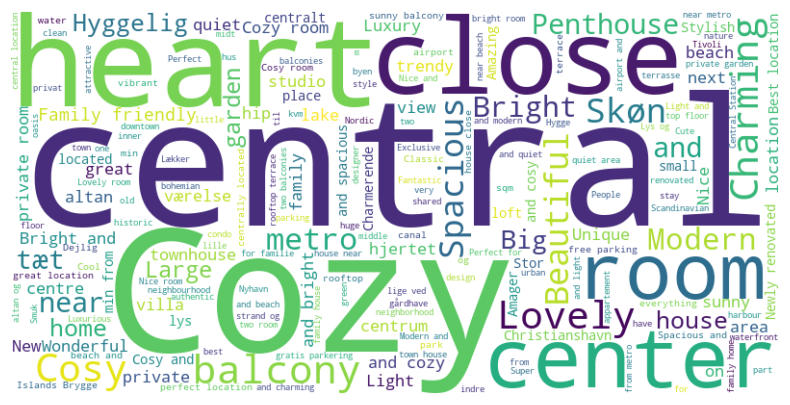

In [1]:
# pip install pandas
# pip install scikit-learn
import pandas as pd
import sklearn as sk

# load the data
data = pd.read_csv('listings.csv')

# filter relevant columns
data_limited = data[["id",
    "name",
    "host_id"  ,
    "host_name" , 
    "neighbourhood_cleansed"  ,
    "latitude"  ,
    "longitude"  ,
    "room_type"  ,
    "price"  ,
    "minimum_nights"  ,
    "number_of_reviews",  
    "last_review"  ,
    "review_scores_rating"  ,
    "review_scores_accuracy" , 
    "review_scores_cleanliness"  ,
    "review_scores_checkin"  ,
    "review_scores_communication"  ,
    "review_scores_location"  ,
    "review_scores_value"  ,
    "reviews_per_month"  ,
    "calculated_host_listings_count"  ,
    "availability_365",]]

# removing rows with no reviews

data_filtered = data_limited.loc[data_limited['number_of_reviews'] != 0]

# remove nan

data_filtered = data_filtered.dropna()
data_filtered.head()

# get a list of distinct values from neighbourhood_cleansed columns in data_filtered

neighbourhoods = data_filtered["neighbourhood_cleansed"].unique()

# replace e.g. Nrrbro with Nørrebro in neighbourhood_cleansed column

data_filtered["neighbourhood_cleansed"] = data_filtered["neighbourhood_cleansed"].replace("Nrrebro", "Nørrebro")
data_filtered["neighbourhood_cleansed"] = data_filtered["neighbourhood_cleansed"].replace("sterbro", "Østerbro")
data_filtered["neighbourhood_cleansed"] = data_filtered["neighbourhood_cleansed"].replace("Vanlse", "Vanløse")
data_filtered["neighbourhood_cleansed"] = data_filtered["neighbourhood_cleansed"].replace("Brnshj-Husum", "Brønshøj-Husum")
neighbourhoods = data_filtered["neighbourhood_cleansed"].unique()

# Remove dollar signs and commas and convert to float - note the prices are actually in DKK
data_filtered['price'] = data_filtered['price'].replace('[\$,]', '', regex=True).astype(float)

# Calculate the median price
median_price = data_filtered['price'].median()

# Create a new column 'price_category' with 0 for 'affordable' and 1 for 'expensive'
data_filtered['price_category'] = (data_filtered['price'] > median_price).astype(int)

display(data_filtered.head())

# Describe the apartments using a wordcloud
# Remember to install packages
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Combine the two lists of stop words
stop_words = ['Østerbro', 'Copenhagen', 'København', 'in', 'bedroom', 'bedrooms', 'bed', 'beds', 'bath', 'baths', 'Frederiksberg', 'V', 'Ø', 'SV', 'S', 'N', 'K', 'C', 'W', 'kbh', 'Ballerup', 'Hellerup', 'Valby', 'Vanløse', 'Brønhøj', 'Nørrebro', 'Vesterbro', "CPH", "with", "to", "of", "a", "the", "på", "i", "med", "af", "at", "city", "by", "apartment", "appartment", "lejlighed", "flat", "m2", "apt"]

# Convert the 'name' column to a single string
text = ' '.join(data_filtered['name'].astype(str))

# Create and generate a word cloud image
wordcloud = WordCloud(stopwords=stop_words, background_color="white", width=800, height=400).generate(text)

# Display the generated word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

## Your tasks start here


### 1. Since data science is so much fun, provide a word cloud of the names of the hosts, removing any names of non-persons. Does this more or less correspond with the distribution of names according to [Danmarks Statistik](https://www.dst.dk/da/Statistik/emner/borgere/navne/navne-i-hele-befolkningen)?

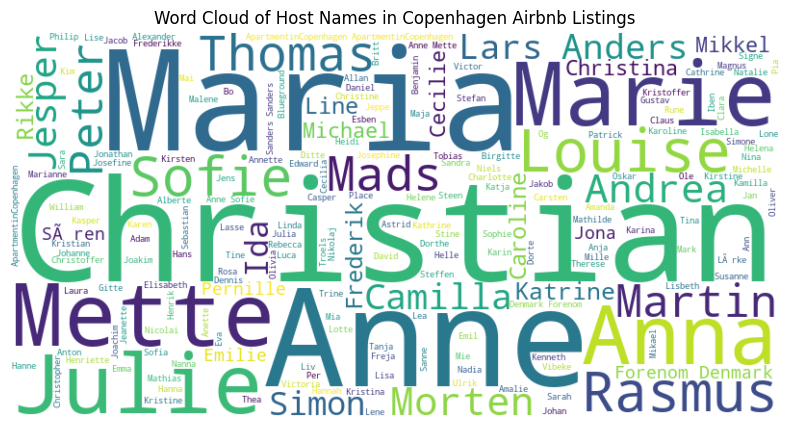

,Name,Official_Frequency,Host_Frequency,Percentage_in_Hosts
20,Peter,46552,96,0.694947
21,Michael,44338,63,0.456059
0,Anne,43741,101,0.731142
22,Lars,43290,84,0.608079
23,Jens,42123,42,0.304039
24,Thomas,41914,106,0.767337
25,Henrik,40996,52,0.376430
26,Søren,38745,0,0.000000
1,Mette,38133,144,1.042421
27,Christian,37480,145,1.049660


Correlation Coefficient: 0.2293


In [8]:
# State your solution here. Add more cells if needed.
import pandas as pd
import matplotlib.pyplot as plt
from wordcloud import WordCloud

file_path = "listings.xlsx"
df = pd.read_excel(file_path)

if 'host_name' in df.columns:
    host_names = df['host_name'].dropna()  # Remove NaN values
    
# List of danish names that we have frequency statistics on
    common_danish_names = {
    "Anne", "Mette", "Kirsten", "Hanne", "Anna", "Helle", "Maria", "Susanne", "Lene", "Marianne",
    "Camilla", "Lone", "Louise", "Pia", "Charlotte", "Tina", "Gitte", "Ida", "Jette", "Julie",
    "Peter", "Michael", "Lars", "Jens", "Thomas", "Henrik", "Søren", "Christian", "Martin", "Jan",
    "Morten", "Jesper", "Anders", "Mads", "Niels", "Rasmus", "Mikkel", "Per", "Kim", "Hans"
}
    
# Filter names using our names list
    filtered_host_names = [name for name in host_names.astype(str) if name.split()[0] in common_danish_names]



    
# Generate wordcloud
wordcloud_filtered = WordCloud(width=800, height=400, background_color="white").generate(" ".join(filtered_host_names))


# Display the wordcloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")  # Hide axes for better visualization
plt.title("Word Cloud of Host Names in Copenhagen Airbnb Listings")
plt.show()

# Extract host names and their occurrences
if 'host_name' in df.columns:
    host_name_counts = df['host_name'].dropna().value_counts().to_dict()
else:
    raise ValueError("The column 'host_name' was not found in the dataset.")

# Define the Danmarks Statistik names and their frequency
danish_names_freq = {
    "Anne": 43741, "Mette": 38133, "Kirsten": 36401, "Hanne": 35725, "Anna": 33537,
    "Helle": 33094, "Maria": 30158, "Susanne": 30129, "Lene": 29784, "Marianne": 26032,
    "Camilla": 24507, "Lone": 24339, "Louise": 23830, "Pia": 23630, "Charlotte": 23512,
    "Tina": 22969, "Gitte": 22619, "Ida": 21966, "Jette": 21908, "Julie": 21893,
    "Peter": 46552, "Michael": 44338, "Lars": 43290, "Jens": 42123, "Thomas": 41914,
    "Henrik": 40996, "Søren": 38745, "Christian": 37480, "Martin": 36944, "Jan": 36134,
    "Morten": 33601, "Jesper": 33394, "Anders": 33292, "Mads": 32153, "Niels": 32035,
    "Rasmus": 30269, "Mikkel": 29190, "Per": 28700, "Kim": 28189, "Hans": 27709
}

comparison_data = []
total_hosts = sum(host_name_counts.values())  # Total number of hosts

for name, official_freq in danish_names_freq.items():
    host_freq = host_name_counts.get(name, 0)  # Get count from host data, default to 0 if not found
    percentage_in_hosts = (host_freq / total_hosts) * 100 if total_hosts > 0 else 0

    comparison_data.append({
        "Name": name,
        "Official_Frequency": official_freq,
        "Host_Frequency": host_freq,
        "Percentage_in_Hosts": percentage_in_hosts
    })

# Convert to DataFrame
comparison_df = pd.DataFrame(comparison_data)
comparison_df = comparison_df.sort_values(by="Official_Frequency", ascending=False)

# Display results
from IPython.display import display
display(comparison_df)

# Calculate correlation between Official Frequency and Host Frequency
correlation_coefficient = comparison_df["Official_Frequency"].corr(comparison_df["Host_Frequency"])

# Display the result
print(f"Correlation Coefficient: {correlation_coefficient:.4f}")


The popularity of a name in DK, does not seem to have any connection to the percentage of hosts with that name in the table above.
Very low correlation coefficient, which concludes that the most popular names in DK and the names of AirBNB hosts have little to no correlation at all

### 2. Using non-scaled versions of latitude and longitude, plot the listings data on a map.

In [10]:
# State your solution here. Add more cells if needed.
import pandas as pd
import folium


file_path = "listings.xlsx"  
df = pd.read_excel(file_path)

# Define the center of the map (mean latitude and longitude of all listings)
center_lat = df['latitude'].mean()
center_long = df['longitude'].mean()

# Create a Folium map centered on Copenhagen
copenhagen_map = folium.Map(location=[center_lat, center_long], zoom_start=12)

# Add Airbnb listings as markers on the map
for _, row in df.iterrows():
        folium.CircleMarker(
            location=[row['latitude'], row['longitude']],  # Listing coordinates
            radius=1,  # Small marker size
            color="blue",
            fill=True,
            fill_color="blue",
            fill_opacity=0.6
        ).add_to(copenhagen_map)

# Display the map
display(copenhagen_map) 

### 3. Create boxplots where you have the neighbourhood on the x-axis and price on the y-axis. What does this tell you about the listings in Copenhagen? Keep the x-axis as is and move different variables into the y-axis to see how things are distributed between the neighborhoods to create different plots (your choice).

In [ ]:
# State your solution here. Add more cells if needed.

### 4. Do a descriptive analysis of the neighborhoods. Include information about room type in the analysis as well as one other self-chosen feature. The descriptive analysis should contain mean/average, mode, median, standard deviation/variance, minimum, maximum and quartiles.

In [ ]:
# State your solution here. Add more cells if needed.

### 5. Based on self-chosen features, and with "price_category" as your target, develop a k-Nearest Neighbor model to determine whether a rental property should be classified as 0 or 1. Remember to divide your data into training data and test data. Comment on your findings.

In [ ]:
# State your solution here. Add more cells if needed.